# Introduction

I am a medical doctor working on **artificial intelligence (AI) for medicine**. At present AI is also widely used in the medical field. Particularly, AI performs in the healthcare sector following tasks: **image classification, object detection, semantic segmentation, GANs, text classification, etc**. This notebook addresses **aerial semantic segmentation**, although this topic is not related with medicine.

After reading this notebook, you will be able to understand **basic programming for semantic image segmentation using Keras**.

This is sample code for semantic segmentaion with U-Net and Keras. You can also see SegNet at [Aerial Semantic Segmentation (SegNet, Keras)](https://www.kaggle.com/code/gokifujiya/aerial-semantic-segmentation-segnet-keras/notebook) and [Aerial Semantic Segmentation (U-Net, PyTorch)](https://www.kaggle.com/gokifujiya/aerial-semantic-segmentation-u-net-pytorch/notebook).

# Install packages

First, we have to install packages to conduct image segmentation with Keras.

In [1]:
#!git clone https://github.com/divamgupta/image-segmentation-keras
!git clone https://github.com/rajeevratan84/image-segmentation-keras.git

Cloning into 'image-segmentation-keras'...
remote: Enumerating objects: 1165, done.
remote: Total 1165 (delta 0), reused 0 (delta 0), pack-reused 1165
Receiving objects: 100% (1165/1165), 3.29 MiB | 3.28 MiB/s, done.
Resolving deltas: 100% (750/750), done.


In [2]:
%cd image-segmentation-keras
!python setup.py install

/kaggle/working/image-segmentation-keras
/opt/conda/lib/python3.7/site-packages/setuptools/dist.py:726: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore_opt)
running install
/opt/conda/lib/python3.7/site-packages/setuptools/command/install.py:37: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  setuptools.SetuptoolsDeprecationWarning,
/opt/conda/lib/python3.7/site-packages/setuptools/command/easy_install.py:159: EasyInstallDeprecationWarning: easy_install command is deprecated. Use build and pip and other standards-based tools.
  EasyInstallDeprecationWarning,
running bdist_egg
running egg_info
creating keras_segmentation.egg-info
writing keras_segmentation.egg-info/PKG-INFO
writing dependency_links to keras_segmentation.egg-info/dependency_links.txt
writing entry points to keras_segmentation.eg

# Read CSV File

This csv file contains information as to **different classes of objects** that might be included in each image. Each class of object must have **a different color for distinction of different kinds of objects**. This table shows the corresponding colors to each class of object by the RGB values.

In [3]:
import pandas as pd
df = pd.read_csv('/kaggle/input/semantic-drone-dataset/class_dict_seg.csv')
df.head()

,name,r,g,b
0,unlabeled,0,0,0
1,paved-area,128,64,128
2,dirt,130,76,0
3,grass,0,102,0
4,gravel,112,103,87


This code shows the name of objects that can potentially appear in each image.

In [4]:
df.name

0       unlabeled
1      paved-area
2            dirt
3           grass
4          gravel
5           water
6           rocks
7            pool
8      vegetation
9            roof
10           wall
11         window
12           door
13          fence
14     fence-pole
15         person
16            dog
17            car
18        bicycle
19           tree
20      bald-tree
21      ar-marker
22       obstacle
23    conflicting
Name: name, dtype: object

These names are packed in a list for counting the number of classes, which is necessary for the machine learning process later.

In [5]:
class_list = df.name.values.tolist()
print(class_list)
len(class_list)

['unlabeled', 'paved-area', 'dirt', 'grass', 'gravel', 'water', 'rocks', 'pool', 'vegetation', 'roof', 'wall', 'window', 'door', 'fence', 'fence-pole', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'ar-marker', 'obstacle', 'conflicting']


24

# Sample Images

It is important to see one or several sample original images as well as annotated images. They can be shown in the same way and in a pair. In addition, we should check the data size of these images.

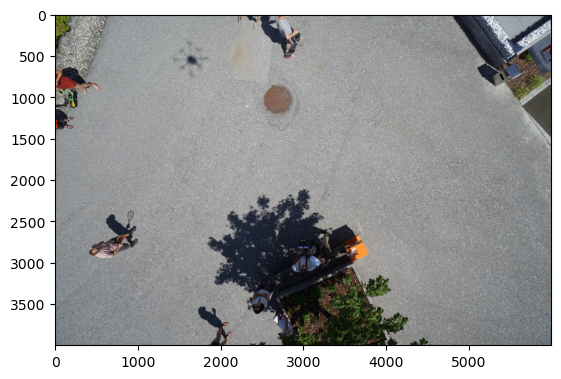

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
# original image
image = Image.open('/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/000.jpg')
image = np.array(image)
plt.imshow(image)

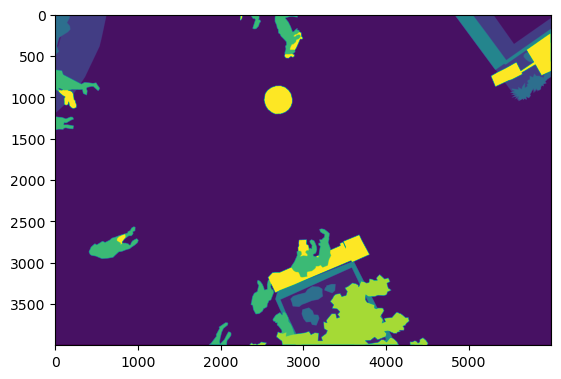

In [7]:
# label image
label = Image.open('/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/000.png')
label = np.array(label)
plt.imshow(label)

In [8]:
image.shape, label.shape

((4000, 6000, 3), (4000, 6000))

In [9]:
image.min(), image.max()

(0, 255)

In [10]:
label.min(), label.max()

(0, 22)

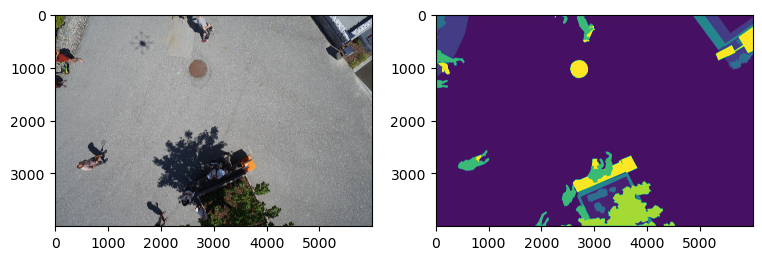

In [11]:
plt.figure(figsize = (9, 4))

plt.subplot(1, 2, 1)
plt.imshow(image)

plt.subplot(1, 2, 2)
plt.imshow(label)

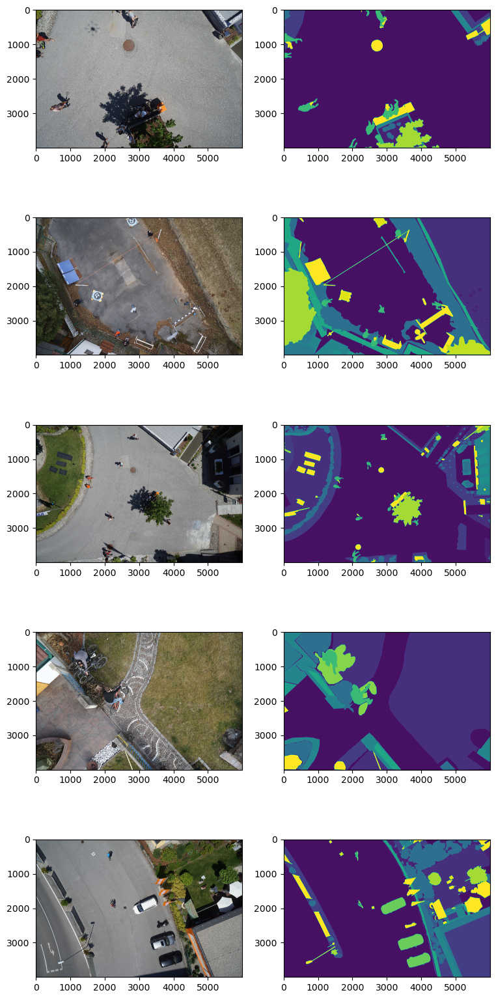

In [12]:
# 5 pairs of original and label images
n_max_imgs = 5

plt.figure(figsize = (9, 20))
for n in range(n_max_imgs):

    image = Image.open(f'/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/00{n}.jpg')
    image = np.array(image)

    label = Image.open(f'/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/00{n}.png')
    label = np.array(label)

    plt.subplot(n_max_imgs, 2, 2 * n + 1)
    plt.imshow(image)

    plt.subplot(n_max_imgs, 2, 2 * n + 2)
    plt.imshow(label)

# Take the Paths for the Data Images

It is possible to create a list consisting paths for data images as to the original images and the annotation images, respectively. In fact, this process is suitable for segmentation with PyTorch but not so much with Keras. But we can see at least the number of these images.

In [13]:
from glob import glob
images = sorted(glob('/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/*.jpg'))
#print(images)

In [14]:
len(images)

400

In [15]:
labels = sorted(glob('/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/*.png'))
#print(labels)

In [16]:
len(labels)

400

# Divide the Data into Training and Validation Datasets

Like other kinds of machine learning, data must be divided into training data and validation data to **prevent overfitting**. It is also possible to divide the data into training, validation, and test data, but we do not choose it because of the small number of data images.

In [17]:
from sklearn.model_selection import train_test_split
import os

# Define the paths to the image and annotation directories.
image_dir = '/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/'
annotation_dir = '/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/'

# Get a list of all the image files.
image_files = os.listdir(image_dir)

# Split the data into a training set and a validation set.
train_files, val_files = train_test_split(image_files, test_size = 0.2, random_state = 42)

# Define the paths to the training and validation directories.
train_images = [os.path.join(image_dir, file) for file in train_files]
train_annotations = [os.path.join(annotation_dir, os.path.splitext(file)[0] + '.png') for file in train_files]
val_images = [os.path.join(image_dir, file) for file in val_files]
val_annotations = [os.path.join(annotation_dir, os.path.splitext(file)[0] + '.png') for file in val_files]

The use of AI models with Keras requires that **training and validation data must be contained in a folder, respectively and separately**, which is different from PyTorch. Thus, we have to **create a folder and store the data in the folder, respectively**. Here, we create data folders for train images, train annotations, validation images, and validation annotations.

In [18]:
import shutil

# Define the destination directory.
destination_dir = '/kaggle/working/train_images'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in train_images:
    shutil.copy2(path, destination_dir)

In [19]:
# Define the destination directory.
destination_dir = '/kaggle/working/train_annotations'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in train_annotations:
    shutil.copy2(path, destination_dir)

In [20]:
# Define the destination directory.
destination_dir = '/kaggle/working/val_images'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in val_images:
    shutil.copy2(path, destination_dir)

In [21]:
# Define the destination directory.
destination_dir = '/kaggle/working/val_annotations'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in val_annotations:
    shutil.copy2(path, destination_dir)

# Initialize a Model

Here, we import a model for semantic segmentation, for which we need information as to the number of classes of objects and the data size.

In [22]:
# unlabeled, tree, gras, other vegetation, dirt, gravel, rocks, water, paved area, pool, person, dog, car
#, bicycle, roof, wall, fence, fence-pole, window, door, obstacle, bald-tree, ar-maker, conflicting 
from keras_segmentation.models.unet import vgg_unet

model = vgg_unet(n_classes = len(class_list), input_height = 320, input_width = 640)

58889256/58889256 [==============================] - 1s 0us/step


# Train the Model

This code below will control the training process. Here, we need access to the data folders, which we created before. You can change hyperparameters as you wish to improve the performance level.

In [23]:
import tensorflow as tf

# Train the model using the training set and validate using the validation set.
callback = tf.keras.callbacks.EarlyStopping(monitor = "val_loss", mode = "min", patience = 4)

model.train(train_images = '/kaggle/working/train_images', train_annotations = '/kaggle/working/train_annotations', 
            val_images = '/kaggle/working/val_images', val_annotations = '/kaggle/working/val_annotations', 
            checkpoints_path = '/tmp/vgg_unet_1', steps_per_epoch = 40, epochs = 15, callbacks = callback)

Verifying training dataset


100%|██████████| 320/320 [04:03<00:00,  1.31it/s]


Dataset verified! 
Epoch 1/15
40/40 [==============================] - 501s 12s/step - loss: 2.0696 - accuracy: 0.5022
Epoch 2/15
40/40 [==============================] - 476s 12s/step - loss: 1.7616 - accuracy: 0.5191
Epoch 3/15
40/40 [==============================] - 503s 12s/step - loss: 1.5647 - accuracy: 0.5785
Epoch 4/15
40/40 [==============================] - 504s 13s/step - loss: 1.4807 - accuracy: 0.5899
Epoch 5/15
40/40 [==============================] - 502s 13s/step - loss: 1.4022 - accuracy: 0.6026
Epoch 6/15
40/40 [==============================] - 497s 12s/step - loss: 1.4005 - accuracy: 0.5815
Epoch 7/15
40/40 [==============================] - 478s 12s/step - loss: 1.2857 - accuracy: 0.6221
Epoch 8/15
40/40 [==============================] - 499s 12s/step - loss: 1.2650 - accuracy: 0.6341
Epoch 9/15
40/40 [==============================] - 498s 12s/step - loss: 1.2205 - accuracy: 0.6443
Epoch 10/15
40/40 [==============================] - 473s 12s/step - loss: 1.2372

# Save the Model

We save the trained model so that we will be able to use it later on another notebook.

In [24]:
model.save('semantic_segmentation_model.h5')

# Prediction

We can compare the original image, annotated image, and predicted image to evaluate the performance by the trained segmentation model.

In [25]:
pred = model.predict_segmentation(
    inp = val_images[0],
    out_fname = '/tmp/pred.jpg')

1/1 [==============================] - 2s 2s/step


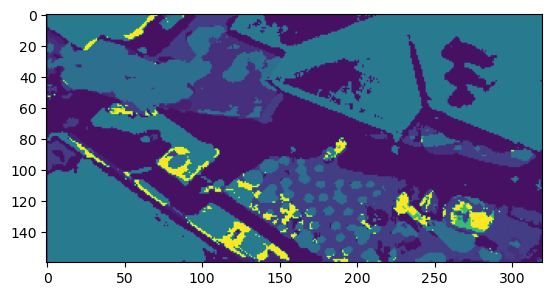

In [26]:
plt.imshow(pred)

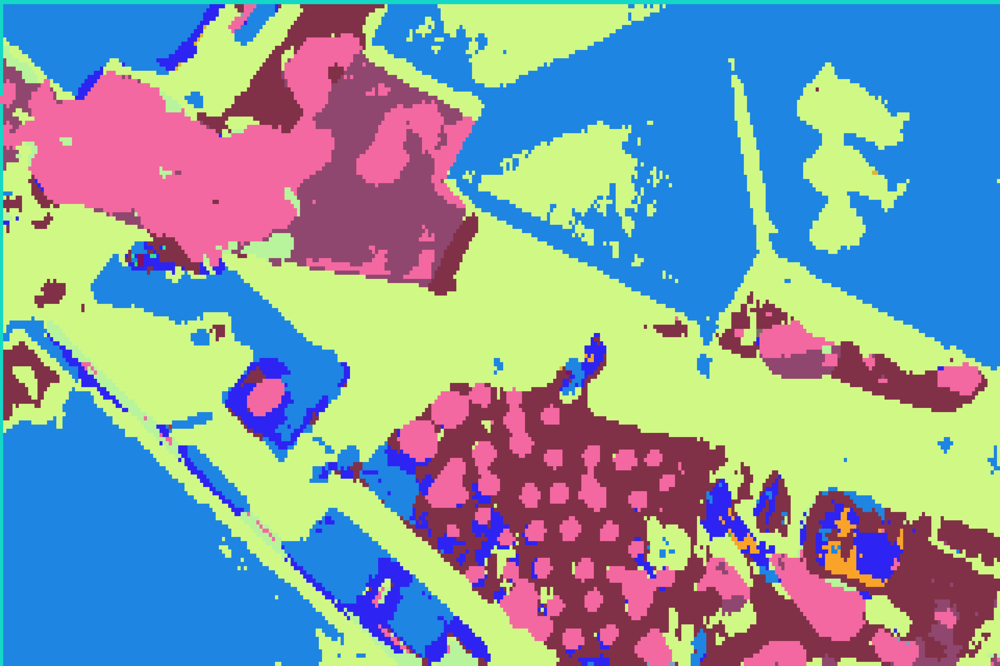

In [27]:
from IPython.display import Image
Image('/tmp/pred.jpg')

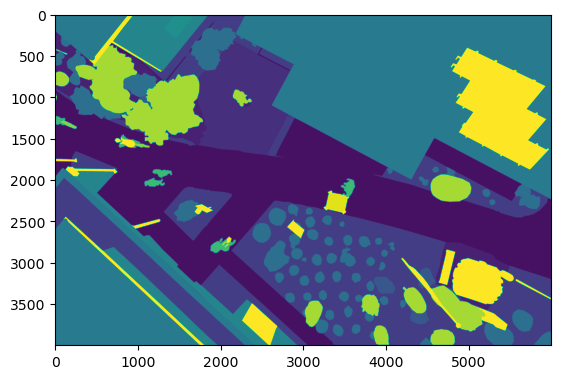

In [28]:
from PIL import Image
truth = Image.open(val_annotations[0])
truth = np.array(truth)
plt.imshow(truth)

# Display with Legend

In [29]:
pred_legend = model.predict_segmentation(
    inp = val_images[0],
    out_fname = '/tmp/pred.jpg' , overlay_img = True, show_legends = True,
    class_names = class_list)

1/1 [==============================] - 1s 1s/step


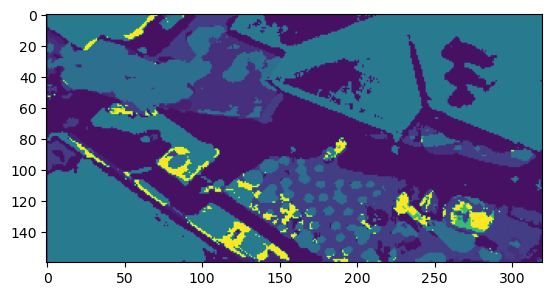

In [30]:
plt.imshow(pred_legend)

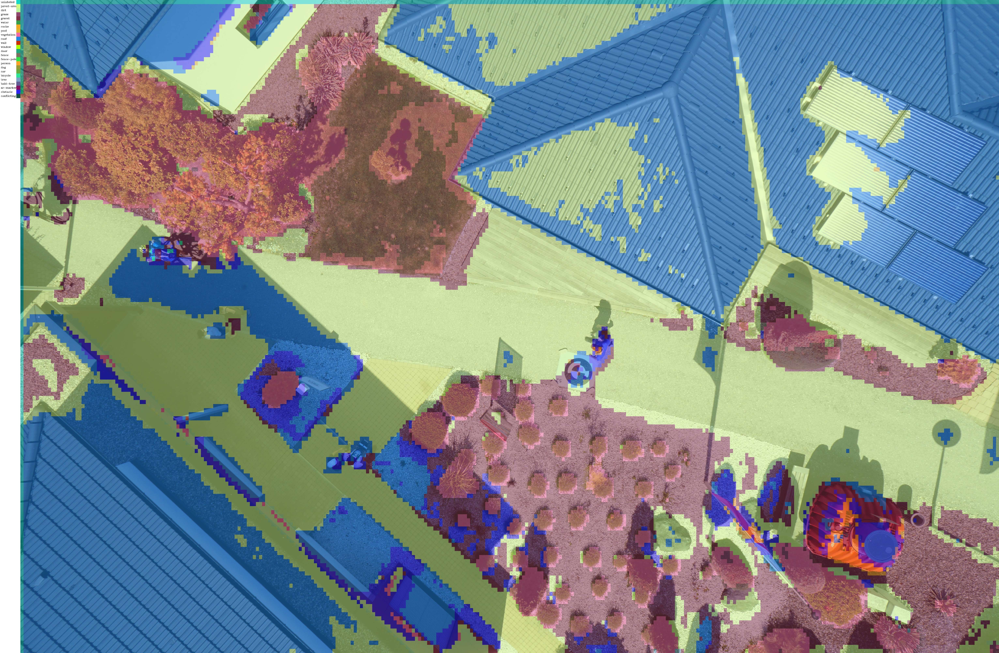

In [31]:
from IPython.display import Image
Image('/tmp/pred.jpg')

# Comparison of Other Data

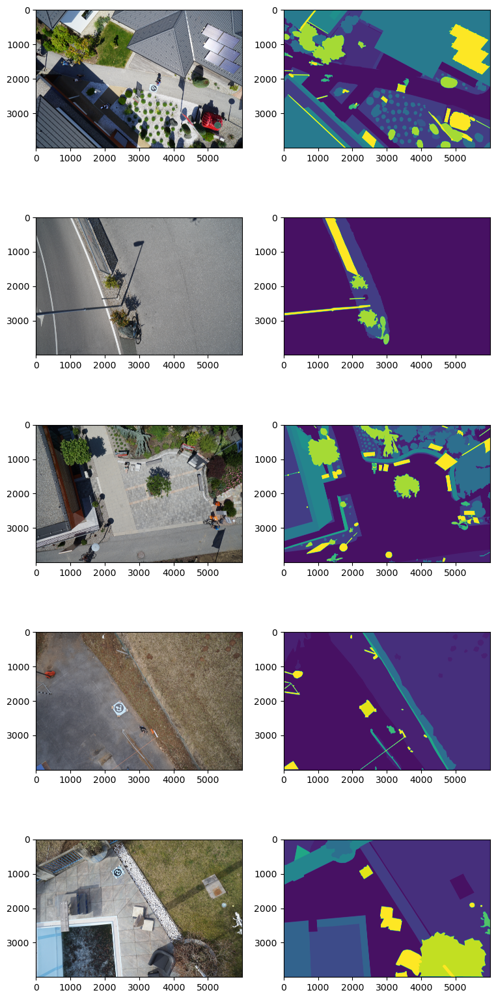

In [32]:
# 5 pairs of original and label images from the validation data
from PIL import Image
n_max_imgs = 5

plt.figure(figsize = (9, 20))
for n in range(n_max_imgs):

    image = Image.open(val_images[n])
    image = np.array(image)

    label = Image.open(val_annotations[n])
    label = np.array(label)

    plt.subplot(n_max_imgs, 2, 2 * n + 1)
    plt.imshow(image)

    plt.subplot(n_max_imgs, 2, 2 * n + 2)
    plt.imshow(label)

1/1 [==============================] - 1s 1s/step


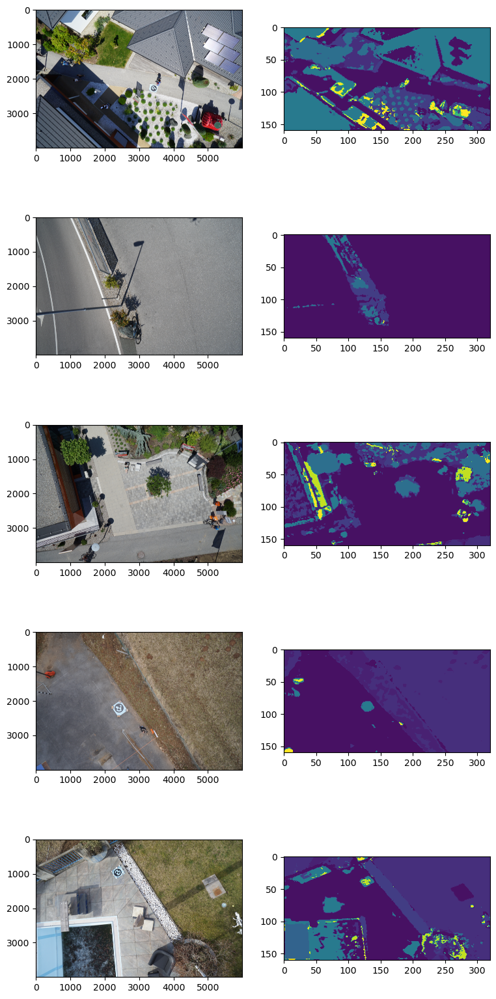

In [33]:
# 5 pairs of original and predicted images from the validation data
n_max_imgs = 5

plt.figure(figsize = (9, 20))
for n in range(n_max_imgs):

    image = Image.open(val_images[n])
    image = np.array(image)

    label = model.predict_segmentation(
            inp = val_images[n],
            out_fname = '/tmp/pred.jpg', overlay_img = True, show_legends = True,
            class_names = class_list)

    plt.subplot(n_max_imgs, 2, 2 * n + 1)
    plt.imshow(image)

    plt.subplot(n_max_imgs, 2, 2 * n + 2)
    plt.imshow(label)

# Load the Model

We can use the saved model later anytime.

In [34]:
# The trained model can be used later.
from tensorflow.keras.models import load_model
model = load_model('/kaggle/working/image-segmentation-keras/semantic_segmentation_model.h5')

In [35]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 320, 640, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 320, 640, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 320, 640, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           